# Lab 2 Exploring Image Data

## By Mohamed Elsaied, Yan Li, Sean Ji, Michael Xu

## Business Motivation


Skin cancer is by far the most common type of all cancers. In fact, 20% of Americans would develop skin cancer in their lifetime. Even though melanoma accounts for only about 1% of skin cancers, it causes a large majority of skin cancer deaths. According to the American Cancer Society, there were around 87K new cases of melanoma diagnosed in the United States, and 9.7K deaths out of that group. The survival rate could be 95% or more if the disease can be detected early. As the rates of melanoma have been rising for the last 30 years, and the screening process charges relatively high, we are thrilled to find a computational way to reduce the cost of screening for any potential melanoma patient, so the suspected melanoma-carrier would be able to do a reliable self-test before making an appointment with a dermatologist, which could be expensive depending on their insurance. 
According to a similar project produced by Stanford University in 2016, the specificity of such computation was around 70%, while their model captures all melanoma carriers. This indicates that the rest 30% would be instructed to visit dermatologist, and they would be told that they are free of melanoma after biopsy. The patients would still have to pay for screening and biopsy, which is not pleasant financially both to the patient and the insurance company, regardless some policies do not cover such procedures. Thus, we would like to achieve an accurate recognition among melanoma with 100% while holding the specificity rate above 85% by using . In other words, our algorithm would be capable of directing the suspected patients to visit dermatologists with high likeliness to be alerted after biopsy, which must be performed by a surgeon extracting a sample tissue for examination to determine the presence of melanoma.


## Business Proposal

Melanoma is the deadliest type of skin cancer, and it is hard to be differentiated from benign skin lesion. Given the fact that most of the diagnoses do not discover melanoma until the late stage, while the screening resource and dermatologists are genuinely limited, we propose to develop this computational method to classify melanoma from benign skin lesion.
This function can be integrated into applications on Android and IOS platforms. The users can classify themselves from melanoma or benign skin lesion by using their smartphone at home at their own convenience, instead of sacrificing work time for appointments of screening procedures. We believe our algorithm can help the users acknowledging the potentials of having such illness during early stage with a low cost by the application, and the users would be suggested to visit dermatologist or not. Consequently, we expect people to spend less on identifying melanoma versus others, while a better rate of survival from melanoma could also be found. 
As for user basis, our proposal expects the users operating the applications on their smart phones with high-performance camera integrated, such as iPhone 6 or later generations. This is fundamental to make a successful and accurate cancer-classification because the cameras should be capable of the demands for such self-served procedure. To satisfy the demand of screening procedures, such capabilities include but not limited to high pixels and macro photography. Statistics shows that there are more than 300M smartphone users in the U.S. as of January 2017. This suggests an average smartphone ownership of approximately one smartphone per American. As smartphones are updated by generations, more and more people would be able to operate our applications with capable smartphones, it is foreseeable that our proposal would embrace a bright popularity given such user basis.

## Measure of Success

As mentioned before, Stanford University has already achieved Dermatologist-level classification with deep neural network in 2016 using 130K images, and they found the specificity of at around 70% while sensitivity remain 100%. Our goal is to achieve a specificity of 85% or above while holding sensitivity 100% still. This helps to reduce the load to the dermatologists so more truly affected patients can be diagnosed in time for treatments.


$$Sensitivity=  \frac{TruePositive}{ ConditionPositive}$$
$$Specificity=  \frac{TrueNegative}{ ConditionNegative}$$





## References

Data Scource:
https://www.isic-archive.com/#!/topWithHeader/onlyHeaderTop/gallery

References:
https://www.aad.org/public/spot-skin-cancer/programs/screenings/what-to-expect-at-a-screening

https://www.cancer.org/cancer/melanoma-skin-cancer/about/key-statistics.html 
https://www.nojitter.com/post/240172378/us-mobile-internet-use-in-a-snapshot

https://www.nature.com/articles/nature21056.epdf?author_access_token=8oxIcYWf5UNrNpHsUHd2StRgN0jAjWel9jnR3ZoTv0NXpMHRAJy8Qn10ys2O4tuPakXos4UhQAFZ750CsBNMMsISFHIKinKDMKjShCpHIlYPYUHhNzkn6pSnOCt0Ftf6


# Data Preparation
### Read data as numpy array

In [1]:
# Import Usefule module
import numpy as np
import cv2 # This module helps read/load images
import glob # This module helps read all image in one file
from skimage.io import imshow
import matplotlib as plt
from matplotlib import pyplot as plt
from sklearn.decomposition import PCA
import seaborn as sns
from ipywidgets import widgets
from skimage.measure import structural_similarity as ssim
import sys
from collections import Counter
import pandas as pd

We choose more 1095 images for both the benign and the melanoma from https://www.isic-archive.com/#!/topWithHeader/onlyHeaderTop/gallery. Each of the images is larger than the 20x20.
The images came originally in 767x1022 format, after talking to you we agreed to resize them to 250x250 so we can run it on our laptops

In [ ]:
# Upload all images in a path file and convert them to numpy.array
# 0 specifies the gray scale, 1 specifies the RGB scale. Here, we chose to convert all images to gray scale
images_benign= [cv2.imread(file, 0) for file in glob.glob("C:/Users/micha/Desktop/SMU School Stuff/2018 Fall/CSCE 7324/MachineLearningNotebooks/project2/data/benign-data/benign-data/*.jpg")]
images_Melanoma =  [cv2.imread(file, 0) for file in glob.glob("C:/Users/micha/Desktop/SMU School Stuff/2018 Fall/CSCE 7324/MachineLearningNotebooks/project2/data/Melanoma-data/*.jpg")]


In [7]:
# Combine two images into one set
images = images_benign + images_Melanoma

### Visualize several images

We show the first 3 images for benign and Melanoma in our dataset. As we can see, it is hard to tell the difference between them in the gray scale (they both have images that has a big black spot at the center).

The belowing code is from your lecture_04 code!

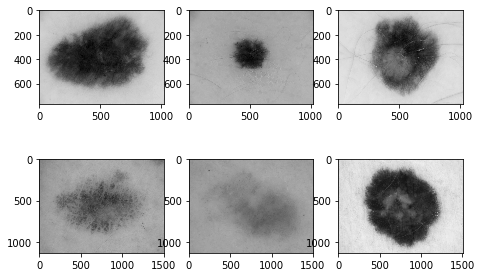

In [8]:
# It tells the machine to print/subploting all iamges from the first one all the way to the n_rows*n_cols one

n_rows = 2 # How many rows of gallery we want to have
n_cols = 3 # How many columns of gallery we want to have
for i in range(n_rows * n_cols):
    plt.subplots_adjust(bottom=0, left=.01, right=.99, top=.90, hspace=.35)
    plt.subplot(n_rows, n_cols, i + 1)
    if i<3:
        plt.imshow(images[i],cmap=plt.cm.gray)
    else:
        plt.imshow(images[i+536],cmap=plt.cm.gray)


### Linearize the np.array to 1D feature array (for non-unique dimension)

Now we would like to linearize our image data set so that we can run PCA on them.

In [9]:
np_array_images = np.array(images)  #converts to an numpy array
for i in range (np_array_images.shape[0]):
    np_array_images[i] = np.resize(np_array_images[i],(250,250)) #resizes all the images to be the same shape


In [10]:
#Check the shape/dimension for images
np_array_images.shape

(1095,)

In [11]:
# Some basic variables we need for furthur use (mainly for the PCA which follows your lecture_04 code)
n_samples = np_array_images.shape[0] # Determine the number of images
h = np_array_images[0].shape[0] # Pull out the first image, and calculate the row size
w = np_array_images[0].shape[1] # Pull out the first image, and calculate the column size
np_array_images.shape # The reason the out put only shows the number of image is because is a giant array with 1095 array in it

(1095,)

In [12]:
# Once we know the dimension of each images, we can start constrcut the 1D image features
feature_images = np_array_images # This part is for the simplicity in the furthur use of PCA and Daisy
for i in range(np_array_images.shape[0]):
    feature_images[i] = feature_images[i].reshape(-1, h*w)   # -1 stands for the row transformation
                                                   # Recall numbers that represents the nrow and ncol

#Check the dimension
feature_images[0].shape

(1, 62500)

In [13]:
# Vertically stack up all individual arrays
feature_images = np.vstack(feature_images)
feature_images.shape

(1095, 62500)

## Linearization for images with the same dimension 

This is an anditional part. For people who may have the image dataset with the same dimension, we recommend to use this code (the top part will not work).

In [14]:
# For all images with the same dimension!!!1

# tmp = np.resize(np_array_images, (np_array_images[0], 250, 250))
# feature_images = tmp.reshape(-1, h*w)
# n_samples = np_array_images.shape[0]
# h = np_array_images.shape[1]
# w = np_array_images.shape[2]

# Data Reduction
### Perform linear PCA for dimension reduction
##### Linear PCA reduction using full PCA

Majority of the code for PCA is come from the lecture_04 code!

In [15]:
# Classify the image of the feature_images to be group 0 for benign, 1 for Melanoma
y1 = np.arange(np.array(images_benign).shape[0])
for i in range(np.array(images_benign).shape[0]):
    y1[i] = 0

y2 = np.arange(np.array(images_Melanoma).shape[0])
for i in range(np.array(images_Melanoma).shape[0]):
    y2[i] = 1
y=np.append(y1,y2)

y.shape

(1095,)

In [16]:
names = np.array(['Benign', 'Melanoma'])

In [17]:
X=feature_images #Specify the X as our linearize dataset

# Here performs a linear PCA
# THis part is from your class code
def plot_explained_variance(pca):
    import plotly
    from plotly.graph_objs import Bar, Line
    from plotly.graph_objs import Scatter, Layout
    from plotly.graph_objs.scatter import Marker
    from plotly.graph_objs.layout import XAxis, YAxis
    plotly.offline.init_notebook_mode() # run at the start of every notebook
    
    explained_var = pca.explained_variance_ratio_
    cum_var_exp = np.cumsum(explained_var)
    
    plotly.offline.iplot({
        "data": [Bar(y=explained_var, name='individual explained variance'),
                 Scatter(y=cum_var_exp, name='cumulative explained variance')
            ],
        "layout": Layout(xaxis=XAxis(title='Principal components'), yaxis=YAxis(title='Explained variance ratio'))
    })
        

pca = PCA(n_components=300) # Manipulate the number here to see how many explained variance we want
X_pca = pca.fit(X)         # fit the model with X, our dataset
plot_explained_variance(pca)

From the explained variance plot, we find that at 100 components we explain 98% of the data, so we will go with 100 component

##### Using randomized PCA

In [18]:
# lets do some PCA of the features and go from 1095 features to 300 features
n_components = 100 #Make sure the n_components * h * w is less than total feasutres of all images
print ("Extracting the top %d eigenimages from %d images" % (
    n_components, X.shape[0]))

rpca = PCA(n_components=n_components,svd_solver='randomized')
%time rpca.fit(X.copy())
eigenfaces = rpca.components_.reshape((n_components, h, w))

Extracting the top 100 eigenimages from 1095 images
Wall time: 5.41 s


In [19]:
# Plot the explained variace
print ("Extracting the top %d eigenimages from %d images" % (
    n_components, X.shape[0]))

pca = PCA(n_components=n_components)
%time pca.fit(X.copy())
eigenfaces = pca.components_.reshape((n_components, h, w))
plot_explained_variance(pca) # Recall the def function we used earlier for full PCA

Extracting the top 100 eigenimages from 1095 images
Wall time: 5.3 s


### Non-linear PCA (kernal PCA)

In [20]:
%%time
from sklearn.decomposition import KernelPCA

print ("Extracting the top %d eigenfaces from %d faces, not calculating inverse transform" % (n_components, X.shape[0]))

kpca = KernelPCA(n_components=n_components, kernel='rbf', 
                fit_inverse_transform=False, gamma=12, # very sensitive to the gamma parameter,
                remove_zero_eig=True)  
kpca.fit(X.copy())

Extracting the top 100 eigenfaces from 1095 faces, not calculating inverse transform
Wall time: 3.26 s


In [21]:
%%time
#  THIS  TAKES A LONG TIME TO RUN
from sklearn.decomposition import KernelPCA

print ("Extracting the top %d eigenfaces from %d faces, ALSO getting inverse transform" % (n_components, X.shape[0]))

kpca = KernelPCA(n_components=n_components, kernel='rbf', 
                fit_inverse_transform=True, gamma=12, # very sensitive to the gamma parameter,
                remove_zero_eig=True)  
kpca.fit(X.copy())

Extracting the top 100 eigenfaces from 1095 faces, ALSO getting inverse transform
Wall time: 3.58 s


### Visuaily comparison among three different methods using reconstruction

In [22]:
import warnings
# warnings.simplefilter('ignore', DeprecationWarning)
# warnings.simplefilter("always",DeprecationWarning)


def plt_reconstruct(idx_to_reconstruct):
    idx_to_reconstruct = np.round(idx_to_reconstruct)
    
    reconstructed_image = pca.inverse_transform(pca.transform(X[idx_to_reconstruct].reshape(1, -1)))
    reconstructed_image_rpca = rpca.inverse_transform(rpca.transform(X[idx_to_reconstruct].reshape(1, -1)))
    reconstructed_image_kpca = kpca.inverse_transform(kpca.transform(X[idx_to_reconstruct].reshape(1, -1)))
    
    
    plt.figure(figsize=(15,7))
    
    plt.subplot(1,4,1)
    plt.imshow(X[idx_to_reconstruct].reshape((h, w)), cmap=plt.cm.gray)
    #plt.title(names[y[idx_to_reconstruct]])
    plt.grid()
    
    plt.subplot(1,4,2)
    plt.imshow(reconstructed_image.reshape((h, w)), cmap=plt.cm.gray)
    plt.title('Full PCA')
    plt.grid()
    
    plt.subplot(1,4,3)
    plt.imshow(reconstructed_image_rpca.reshape((h, w)), cmap=plt.cm.gray)
    plt.title('Randomized PCA')
    plt.grid()
    
    plt.subplot(1,4,4)
    plt.imshow(reconstructed_image_kpca.reshape((h, w)), cmap=plt.cm.gray)
    plt.title('Kernel PCA')
    plt.grid()
    
    
widgets.interact(plt_reconstruct,idx_to_reconstruct=(0,n_samples-1,1),__manual=True)

interactive(children=(IntSlider(value=547, description='idx_to_reconstruct', max=1094), Output()), _dom_classe…

<function __main__.plt_reconstruct(idx_to_reconstruct)>

However, it is hard for machine to visulize the differences among different images. Thus, we introduced a method called Structual Similarity Index Measure model, which abbreviates as SSIM.

The general formula for this model is : $SSIM(x,y) = \frac{(2\mu_x\mu_y+c_1)(2\sigma_{xy}+c_2)}{(\mu_x^2+\mu_y^2+c_1)(\sigma_x^2\sigma_y^2+c_2)}$

Where $c_1=(k_1L)^2$ and $c_2=(k_2L)^2$ ($k_1$ by default is 0.01, $k_2$ by default is 0.02, and $L$ is typically $2^{bits' number/pixel}-1$

The reason we are not using MSE method is kPCA will always have the largest MSE (according to what Eric said on class!).

References:

https://www.pyimagesearch.com/2014/09/15/python-compare-two-images/

https://en.wikipedia.org/wiki/Structural_similarity


In [23]:
## Convert all transformation data back to (6, 62500) size
## The varialbe feature_images is our originial pic in (6,62500)

pca_array = pca.inverse_transform(pca.transform(X))
kpca_array = kpca.inverse_transform(kpca.transform(X))
rpca_array = rpca.inverse_transform(rpca.transform(X))

## Convert all array data type to uint8
pca_array = np.array(pca_array, dtype = np.uint8)
rpca_array = np.array(rpca_array, dtype = np.uint8)
kpca_array = np.array(kpca_array, dtype = np.uint8)



In [43]:
# Calculate the ssim index for each method
import warnings
warnings.filterwarnings('ignore')
total_pca_ssim = 0
total_rpca_ssim = 0
total_kpca_ssim = 0
for i in range(np_array_images.shape[0]):
    total_pca_ssim += ssim(feature_images[i], pca_array[i])
    total_rpca_ssim += ssim(feature_images[i], rpca_array[i])
    total_kpca_ssim += ssim(feature_images[i], kpca_array[i])


pca_ssim = total_pca_ssim / np_array_images.shape[0]
rpca_ssim = total_rpca_ssim / np_array_images.shape[0]
kpca_ssim = total_kpca_ssim / np_array_images.shape[0]


C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.

C:\anaconda3\lib\site-packages\skimage\measure\_structural_similarity.py:234: skimage_deprecation:

Function ``structural_similarity`` is deprecated and will be removed in version 0.14. Use ``compare_ssim`` instead.



In [25]:
print("The ssim index for full PCA is", pca_ssim)
print("The ssim index for randomized PCA is", rpca_ssim)
print("The ssim index for kernel PCA is", kpca_ssim)


The ssim index for full PCA is 0.9042223697117263
The ssim index for randomized PCA is 0.9043373205922748
The ssim index for kernel PCA is 0.8748168513820808


# Daisy features extraction

The image/filter is "mess up" because we resiezed large (high resolution) images to small (really really low resolution) images.
(From 780k to 62500)

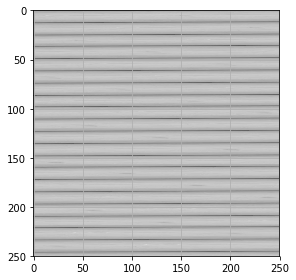

In [26]:
from skimage.io import imshow
import warnings

idx_to_reconstruct = int(np.random.rand(1)*len(X))
img  = X[idx_to_reconstruct].reshape((h,w))
imshow(img)
plt.grid()

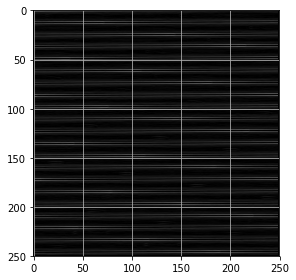

In [27]:
from skimage.filters import sobel_h, sobel_v
import warnings

gradient_mag = np.sqrt(sobel_v(img)**2 + sobel_h(img)**2 ) 
imshow(gradient_mag)
plt.grid()

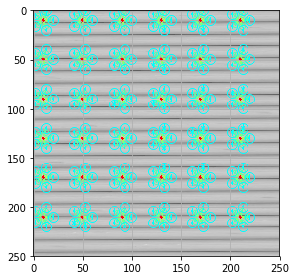

In [28]:
from skimage.feature import daisy
import warnings

# lets first visualize what the daisy descripto looks like
features, img_desc = daisy(img,step=40, radius=10, rings=3, histograms=5, orientations=8, visualize=True)
imshow(img_desc)
plt.grid()

In [29]:
# now let's understand how to use it
features = daisy(img,step=10, radius=10, rings=2, histograms=4, orientations=8, visualize=False)
print(features.shape)
print(features.shape[0]*features.shape[1]*features.shape[2])

(23, 23, 72)
38088


In [30]:
# create a function to take in the row of the matric and return a new feature
def apply_daisy(row,shape):
    feat = daisy(row.reshape(shape),step=10, radius=10, rings=2, histograms=6, orientations=8, visualize=False)
    return feat.reshape((-1))

h = 250
w = 250
%time test_feature = apply_daisy(X[3],(h,w))
test_feature.shape

Wall time: 85.4 ms


(55016,)

In [31]:
# apply to entire data, row by row,
# takes about a minute to run
%time daisy_features = np.apply_along_axis(apply_daisy, 1, X, (h,w))
print(daisy_features.shape)

Wall time: 1min 42s
(1095, 55016)


In [32]:
from sklearn.metrics.pairwise import pairwise_distances
# find the pairwise distance between all the different image features
%time dist_matrix = pairwise_distances(daisy_features)
dist_matrix.shape

Wall time: 857 ms


(1095, 1095)

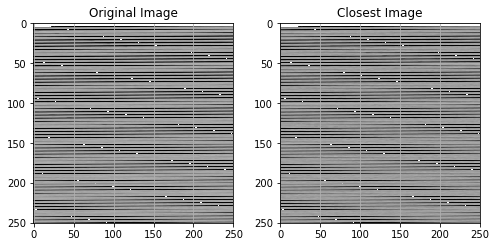

In [33]:
import copy
# find closest image to current image
idx1 = 5
distances = copy.deepcopy(dist_matrix[idx1,:])
distances[idx1] = np.infty # dont pick the same image!
idx2 = np.argmin(distances)

plt.figure(figsize=(7,10))
plt.subplot(1,2,1)
imshow(X[idx1].reshape((h,w)))
plt.title("Original Image")
plt.grid()

plt.subplot(1,2,2)
imshow(X[idx2].reshape((h,w)))
plt.title("Closest Image")
plt.grid()

In [34]:
from ipywidgets import fixed
# put it together inside a nice widget
def closest_image(dmat,idx1):
    distances = copy.deepcopy(dmat[idx1,:]) # get all image diatances
    distances[idx1] = np.infty # dont pick the same image!
    idx2 = np.argmin(distances)
    
    distances[idx2] = np.infty
    idx3 = np.argmin(distances)
    
    plt.figure(figsize=(10,16))
    plt.subplot(1,3,1)
    imshow(X[idx1].reshape((h,w)))
    plt.title("Original Image of "+names[y[idx1]])
    plt.grid()

    plt.subplot(1,3,2)
    imshow(X[idx2].reshape((h,w)))
    plt.title("Closest Image of "+names[y[idx2]])
    plt.grid()
    
    plt.subplot(1,3,3)
    imshow(X[idx3].reshape((h,w)))
    plt.title("Next Closest Image of "+names[y[idx3]])
    plt.grid()
    
widgets.interact(closest_image,idx1=(0,n_samples-1,1),dmat=fixed(dist_matrix),__manual=True)

interactive(children=(IntSlider(value=547, description='idx1', max=1094), Output()), _dom_classes=('widget-int…

<function __main__.closest_image(dmat, idx1)>

## Visualizing DAISY

Text(0.5,1,'Heatmap of Pairwise distance for all training images')

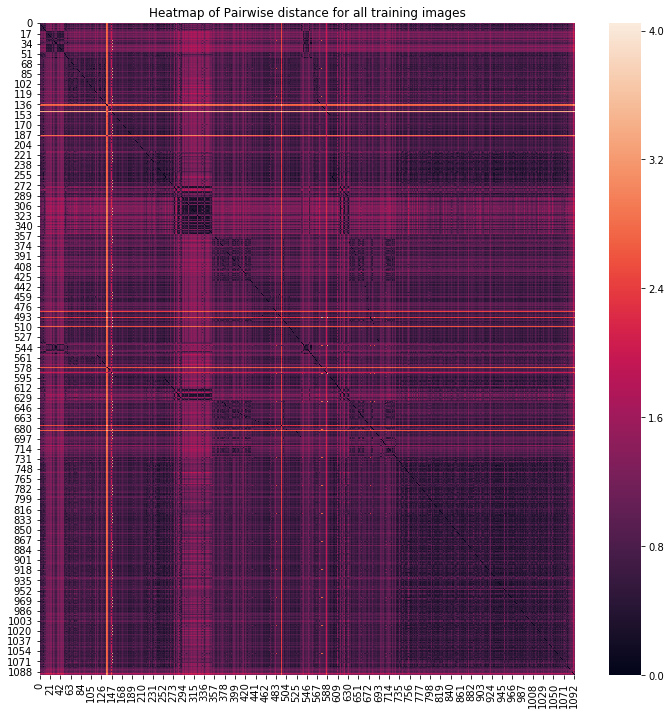

In [35]:
fig = plt.figure(figsize=(12,12))
r = sns.heatmap(dist_matrix)
r.set_title("Heatmap of Pairwise distance for all training images")

From the heat map, we can tell the Daisy is not a good feature extration method for our current data set because there is no obvious pattern for two classifications (benign vs. melanoma area should have a relatively large distance). This problem may caused by the resized image (since we resiezed to a relatively low dimension, nearly all images turns to a set of blury images).

Let's take a close to look to its classcification heatmap.

In [36]:
dist_matrix_class = [[0], [0], [0], [0]]
sum_distance_benign = 0
sum_distance_melanoma = 0
sum_distance_melanoma_benign = 0

for i in range(np.array(images_benign).shape[0]):
    for j in range(np.array(images_benign).shape[0]):
        sum_distance_benign += dist_matrix[i][j]

i = np.array(images_benign).shape[0]
j = np.array(images_benign).shape[0]
for i in range(np.array(images_Melanoma).shape[0]):
    for j in range(np.array(images_Melanoma).shape[0]):
        sum_distance_melanoma += dist_matrix[i][j]  
i=0
for i in range(np.array(images_benign).shape[0]):
    for j in range(np.array(images_Melanoma).shape[0]):
        sum_distance_melanoma_benign += dist_matrix[i][j]

dist_matrix_class[0] = [sum_distance_benign/np.array(images_benign).shape[0]/np.array(images_benign).shape[0]]
dist_matrix_class[1] = [sum_distance_melanoma_benign/np.array(images_benign).shape[0]/np.array(images_Melanoma).shape[0]]
dist_matrix_class[2] = dist_matrix_class[1]
dist_matrix_class[3] = [sum_distance_melanoma/np.array(images_Melanoma).shape[0]/np.array(images_Melanoma).shape[0]]


Text(0.5,1,'Heatmap of Pairwise distance for classification')

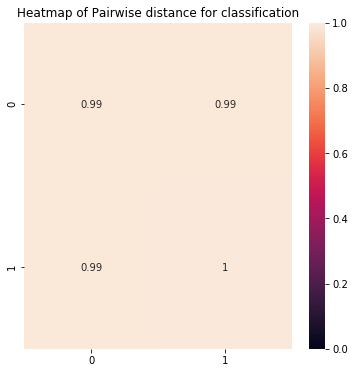

In [37]:
dist_matrix_class = np.reshape(dist_matrix_class, (2,2))
dist_matrix_class = np.array(dist_matrix_class)
fig = plt.figure(figsize=(6,6))
r = sns.heatmap(dist_matrix_class, annot = True, vmin=0, vmax=1)
r.set_title("Heatmap of Pairwise distance for classification")

From the above heatmap, we can see there is no obvious difference (based on Daisy) for these four area, which contradicts our prediction that the classcification heatmap should diagonally have the same color (means the machine can classify the images with a high accurarcy).

To take a close look, we calculate the number of occurance of different categories (distance in 5 range).

We discussed with our friends Lee, Jen, Austin, and Jake on how to validate the results and they suggested measuring inter-class and between class and see if we can conclude something

In [38]:
# convert the Daisy distance matrix to panda dataframe
df_dist = pd.DataFrame(dist_matrix)


# Splite the distance matrix to 3 categories
dist_benign_benign = df_dist[:535].iloc[:,:535] # benign vs benign
dist_benign_melonoma = df_dist[:535].iloc[:,536:] # benign vs melonoma
dist_melonoma_melonoma = df_dist[536:].iloc[:,536:] # melonoma vs melonoma

# labels correspond to buckets of distances
labels = np.array(['-inf<dis<1', '1<dis<2', '2<dis<3', '3<dis<4', "dis > 4"])

# prepare the distance data for each category
# place into buckets, return the count in each bucket
def get_all_distances(dist):
    dist = np.tril(dist, k=-1) # convert to lower triangular
    dist = dist.flatten() # make one dimensional
    dist = dist[np.nonzero(dist)] # remove all zeroes, which get rid of the diagonal matrix
    
    # put the distances into different buckets
    dist = pd.cut(dist, bins=[0, 1, 2, 3, 4, sys.maxsize], labels=False)
    
    # apply labels, convert to counter
    dist = Counter(labels[dist])
    
    # convert to dataframe
    dist = pd.DataFrame(list(dist.items()), columns=['Distance', 'Count'])
    
    return dist

dist_benign_benign_counts = get_all_distances(dist_benign_benign)
dist_benign_melonoma_counts = get_all_distances(dist_benign_melonoma)
dist_melonoma_melonoma_counts = get_all_distances(dist_melonoma_melonoma)


In [39]:

# group the different diff categories# group t 

keys = ['benign_benign', 'benign_melonoma', 'melonoma_melonoma']
dist_lists = [dist_benign_benign_counts, dist_benign_melonoma_counts, dist_melonoma_melonoma_counts]

grouped_dist = pd.DataFrame(columns=['Distance','Type','Count'])

# for each diff category
for i in range(len(dist_lists)):
    temp_list = []
    
    # append all values to the new data frame in a new order
    for j in range(len(dist_lists[i])):
        temp_list.append({'Distance' : dist_lists[i].Distance[j],
                    'Type' : keys[i],
                    'Count' : dist_lists[i].Count[j]})

    grouped_dist = grouped_dist.append(temp_list)

# group by Distance, then Type
grouped_dist = grouped_dist.groupby(['Type', 'Distance']).sum()

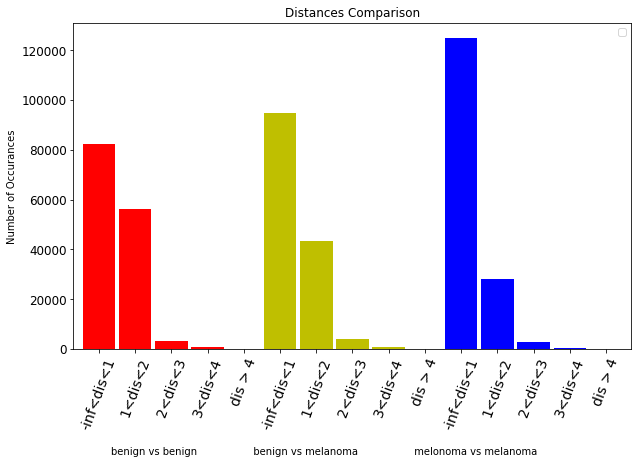

In [40]:
colors = 'rrrrryyyyybbbbb' 
ax = grouped_dist.plot(kind='bar', color=colors, width=0.9, fontsize=12, figsize=(10,6))

plt.ylabel('Number of Occurances')
plt.xlabel('benign vs benign                  benign vs melanoma                  melonoma vs melanoma')
ax.xaxis.set_label_coords(0.45,-0.3)
plt.xticks(rotation=70, fontsize=14)
ax.set_xticklabels(['-inf<dis<1', '1<dis<2', '2<dis<3', '3<dis<4', "dis > 4",
                    '-inf<dis<1', '1<dis<2', '2<dis<3', '3<dis<4', "dis > 4",
                    '-inf<dis<1', '1<dis<2', '2<dis<3', '3<dis<4', "dis > 4"])
plt.title('Distances Comparison')
plt.legend([])
plt.show()

As we can see from the above graph, there is not that many high Daisy pairwised distance cases for benign vs melanoma, which means it is hard for the machine to classify the images based on the Daisy feature extraction method. 

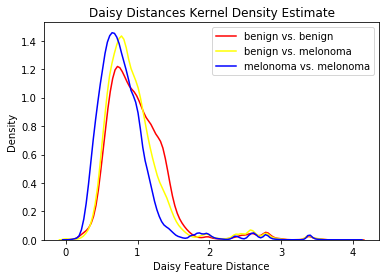

In [41]:
def plot_kde(dist, label, color="blue"):
    dist = np.tril(dist, k=-1)
    dist = dist.flatten()
    dist = dist[np.nonzero(dist)]
    ax = sns.kdeplot(dist, color=color, label=label)

plot_kde(dist_benign_benign, color="red", label="benign vs. benign")
plot_kde(dist_benign_melonoma, color="yellow", label="benign vs. melonoma")
plot_kde(dist_melonoma_melonoma, color="blue", label="melonoma vs. melonoma")
plt.title("Daisy Distances Kernel Density Estimate")
plt.xlabel("Daisy Feature Distance")
plt.ylabel("Density")
plt.show()

 From the abocve plot, most of the area of three classes are overlapping to others. **Thus, the Daisy feature extraction method failed on our prediction task**.

# Exceptional Work
### ORB

The main reason we use ORB to be our optional method is SIFT and SURF is not free in CV2 module (We found a way to run SIFT earlier, but it no longer works after we restarted the laptop. Also, since it is computational expensive to run all images, we subselect the first 50 images of benign and melanoma.

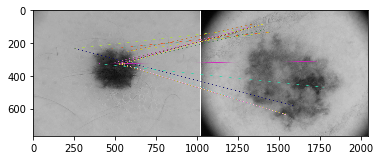

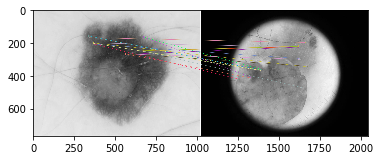

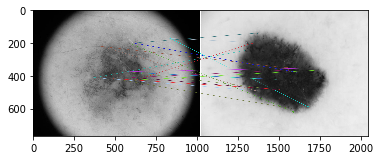

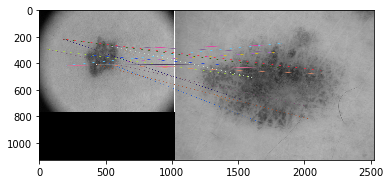

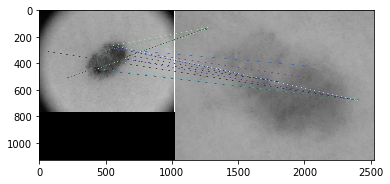

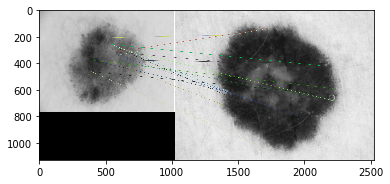

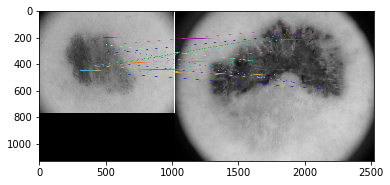

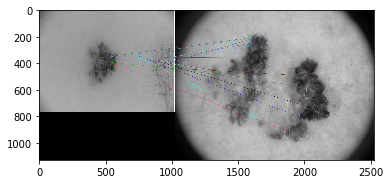

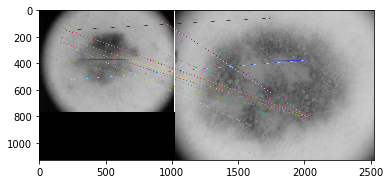

In [39]:
# keypoint matching
import numpy as np
import cv2
from matplotlib import pyplot as plt

img1 = images_benign[:10]          # queryImage
img2 = images_Melanoma[:10]          # trainImage


for i in range(10):
    for j in range(10):
        # Initiate SIFT detector
        orb = cv2.ORB_create()

        # find the keypoints and descriptors with SIFT
        kp1, des1 = orb.detectAndCompute(img1[i],None)
        kp2, des2 = orb.detectAndCompute(img2[j],None)
        
        # create BFMatcher object
        bf = cv2.BFMatcher()

        # Match descriptors.
        matches = bf.knnMatch(des1,des2,k=2)

        # Draw first 10 matches.
        img3 = cv2.drawMatchesKnn(img1[i],kp1,img2[j],kp2,matches[:10],None,flags=2)
        
        if(i == j + 1):
            plt.imshow(img3),plt.show()

We have not work on the KNN since we run out of time (the SIFT took us a day, and it ended up badly). But we believed the way to do the KNN is getting the array/matrix for all features extracted from images (one from the benign, one from the melanoma, and then combine them). Once we have the array with all features, we can use PCA (RPCA or KPCA) to reduce it to a 2D or 3D array. Then use SKlearn build in KNN to make a nice plot on it. Another thought is how many K we need for the KNN. We believe 2 should be good enough since we only have two classification. But, build a for loop (for i in range(30) for k) we also help us on determine which k is the best option.

Once we have built the above classifier, we can start using some new images to test it out (though we believe the result will be bad since benign and melanoma is too close to each other).

Here is the reference we have read:
https://gurus.pyimagesearch.com/lesson-sample-k-nearest-neighbor-classification/

# Conclusion

After performing feature extraction upon the images using a ORB with key point matching, and building a nearest neighbor classifier, we are unable to name an appropriate method for comparisons with the chosen feature extraction technique, since the brute force matching per pair of images did not reflect a satisfactory result.